In [1]:
import os
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import OperationStatusCodes
from msrest.authentication import CognitiveServicesCredentials
from dotenv import load_dotenv
from src.utils import *
from src.utils_azure import *
from src.cor_similar import *

load_dotenv('/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/official/.env')



endpoint = os.environ['AZURE_SHIBA_ENDPOINT_KEY']
subscription_key = os.environ['AZURE_SHIBA_SUBSCRIPTION_KEY']
COMPUTERVISION_CLIENT = ComputerVisionClient(endpoint, CognitiveServicesCredentials(subscription_key))
print("Azure Computer Vision Client is ready to use!")

Azure Computer Vision Client is ready to use!


/home/bu0ai/anaconda3/envs/shiba/lib/python3.10/site-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(


In [2]:
image_path = '/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/data_label/sample-07.png'
det_draw_path = r'/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/demo/weight/draw_231229/best.pt'
det_code_path = r'/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/demo/weight/code_231207/best.pt'
model_restore_resolution = '/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/GFPGAN/experiments/pretrained_models/GFPGANv1.3.pth'


image_cad = Image.open(image_path)
COMPUTERVISION_CLIENT = ComputerVisionClient(endpoint, CognitiveServicesCredentials(subscription_key))

model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=23, num_grow_ch=32, scale=2)
bg_upsampler = RealESRGANer(
                            scale=2,
                            model_path='https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.1/RealESRGAN_x2plus.pth',
                            model=model,
                            tile=400,
                            tile_pad=10,
                            pre_pad=0,
                            half=True) 

# Setup Parammeter for GFPGANer
restorer = GFPGANer(model_path=model_restore_resolution,
                    upscale=2,
                    arch='clean',
                    channel_multiplier=2,
                    bg_upsampler=bg_upsampler)

DET_DRAW_MODEL = load_yolo(det_draw_path)
DET_CODE_MODEL = load_yolo(det_code_path)
COMPUTERVISION_CLIENT = ComputerVisionClient(endpoint, CognitiveServicesCredentials(subscription_key))

/home/bu0ai/anaconda3/envs/shiba/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/bu0ai/anaconda3/envs/shiba/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [3]:
img_high = upscale_image(image_path,
                         restorer,
                         des_path= '/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/tmpFile/temp_azure/temp_azure_cad')
img_high = Image.open(img_high)

Done


In [ ]:
def get_basic_info(image_pil: Image, computervision_client: ComputerVisionClient) -> Dict:
    """Get basic information of document

    Args:
        image_pil (Image): pillow image of basic information

    Returns:
        Dict: The basic information 
    """
    words, boxes = ocr_azure_cad(image_pil.copy(), computervision_client)
    data_df = pd.DataFrame({'words': words, 'boxes': boxes})
    data_df[['left', 'top', 'right', 'bottom']] = data_df['boxes'].apply(pd.Series)
    data_df['words'] = data_df['words'].apply(lambda e: e.replace(' ', ''))

    try:
        construct_type = data_df[data_df.words.str.contains('ids', case=False)]
        construct_type_str = construct_type.words.tolist()[0]
    except:
        construct_type_str = ''

    try:
        # 分 譲 住 宅 建 築 販 売 設 計 施 工
        title_builder_name = process.extractOne("分 譲 住 宅 建 築 販 売 設 計 施 工", words, scorer=fuzz.WRatio)
        title_builder_name_idx = title_builder_name[2]
        title_builder_name_box = boxes[title_builder_name_idx]
        title_builder_name_width = (title_builder_name_box[2] - title_builder_name_box[0]) * 0.5
        
        match_builder_name = data_df[(data_df.left < (title_builder_name_box[2] + title_builder_name_width)) & (data_df.right > title_builder_name_box[0]) &
                                    (data_df.top > title_builder_name_box[1])]
        match_builder_name.sort_values(by='top', inplace=True)
        match_builder_name = match_builder_name[(match_builder_name.iloc[0].top < match_builder_name.bottom) & (match_builder_name.iloc[0].bottom > match_builder_name.top)]
        match_builder_name_str = ' '.join(match_builder_name.sort_values(by='left').words.tolist())
    except:
        try:
            match_builder_name_str = data_df[data_df.words.str.contains('有限公司', case=False)].words
        except:
            try:
                match_builder_name_str = data_df[data_df.words.str.contains('有限公司', case=False)].words
            except:
                match_builder_name_str = ''

    try:
        anken_title = process.extractOne("TITLE", words, scorer=fuzz.WRatio)
        title_anken_idx = anken_title[2]
        title_anken_box = boxes[title_anken_idx]
        title_anken_width = (title_anken_box[2] - title_anken_box[0]) * 4
        match_anken = data_df[(data_df.left < (title_anken_box[2] + title_anken_width)) & 
                            (data_df.right > title_anken_box[0]) &
                            (data_df.top > title_anken_box[1])]
        match_anken.sort_values(by='top', inplace=True)
        match_anken = match_anken[(match_anken.iloc[0].top < match_anken.bottom) & (match_anken.iloc[0].bottom > match_anken.top)]
        match_anken_str = ' '.join(match_anken.sort_values(by='left').words.tolist())
    except:
        match_anken_str = ''
    
    try:
        number_extract = process.extractOne('号棟', words, scorer= fuzz.WRatio)
        num_idx = number_extract[2]
        num_box = boxes[num_idx]
        _, second_nearest_bbox = find_nearest_and_second_nearest_bbox((num_box[0],num_box[1]), boxes)
        get_index_second_nearest_bbox = boxes.index(second_nearest_bbox)
        match_number = int(words[get_index_second_nearest_bbox])
    except:
        match_number = ''

        

    return {"construct_type": [construct_type_str],
            "builder_name": [match_builder_name_str],
            "anken": [match_anken_str],
            "num_S": match_number,
            "ocr": {"words": words, "boxes": boxes}}

In [5]:
result_draw_df = yolo_inference(img_high, DET_DRAW_MODEL, type='draw')
# raw_code_df_full = pd.DataFrame(columns=['boxes','cls','angle'])
# des_path = '/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/tmpFile/temp_azure/temp_azure_cad_restore_2/'

# try:
#     os.remove(des_path)
#     os.makedirs(f"{des_path}", exist_ok=True)
# except:
#     os.makedirs(f"{des_path}", exist_ok=True)

# count = 1

# for temp in result_draw_df.boxes:
#     x1, y1, x2, y2 = temp
#     image_specified_cad = img_high.crop((x1,y1,x2,y2))
#     name_specified = f'image_specified_{x1}_{y1}_{x2}_{y2}.jpg'
#     path_specified = f'/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/tmpFile/temp_azure/temp_azure_cad_restore/{name_specified}'
#     path_specified_restore = f'/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/tmpFile/temp_azure/temp_azure_cad_restore_2/{name_specified}'
#     image_specified_cad.save(path_specified)
    
#     image_specified_restore = upscale_image(image_path= path_specified,
#                                             restorer= restorer,
#                                             is_saved= True,
#                                             des_path= des_path)
    
#     image_specified_restore = Image.open(path_specified_restore)
#     raw_code_df = yolo_inference(image_specified_restore, DET_CODE_MODEL, type= 'code')
#     # raw_code_df_full = pd.concat([raw_code_df, raw_code_df], ignore_index=True)
#     floor = count
#     # code_df = raw_code_df[raw_code_df.boxes.apply(lambda b: calc_ovl(b, ))]

# base_image_pil, draw_location_list = split_images(img_high.copy(), result_draw_df)

# base_info = get_basic_info(base_image_pil, COMPUTERVISION_CLIENT)

In [2]:
import re 
re.findall('','IDS-Ⅶ型')

['Ⅶ']

In [6]:
result_draw_df = yolo_inference(img_high, DET_DRAW_MODEL, type='draw')
basic_dict, floor_dict = {}, {}
raw_code_df = yolo_inference(img_high, DET_CODE_MODEL, type='code')
base_image_pil, draw_location_list = split_images(img_high.copy(), result_draw_df)
basic_info_dict = get_basic_info(base_image_pil, COMPUTERVISION_CLIENT)
basic_info_dict

/tmp/ipykernel_3543731/1885211809.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_builder_name.sort_values(by='top', inplace=True)
/tmp/ipykernel_3543731/1885211809.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_anken.sort_values(by='top', inplace=True)


{'construct_type': ['IDS-VI型(3階建仕様)'],
 'builder_name': ['株式会社 飯田産業'],
 'anken': ['(仙)仙台小田原4期'],
 'num_S': 1,
 'ocr': {'words': ['IDS-VI型(3階建仕様)',
   '耐力壁及び準耐力壁',
   '货架材接合金物 特記',
   '柱端部の接合方法',
   '表記食物は、外周部の接合部にのみ適用する。',
   '短期基準耐力が金物×1+プレカット位口で10. 1kN',
   '新(イ)準耐火構造',
   '※同一壁んに限り、納まり上仕様変更をする場合があります',
   '特記なき外周部及びその他の接合部は、維手をクギ止め金物 に口を羽子板ボルトとする。',
   '「木造动机工法住宅の許容応力度設計」横梁材別部抜合部の許容引張剤力によろ',
   '短期基準耐力が10.0KNの金物',
   '建物の最外邪線より1.5m以内にある入間部分の接合部は、全て羽子板ボルトにて緊結する。',
   '仕口1-1',
   'レスビー羽子板ボルト7.5kX (告示 平12巷告第1160号第2号(に) に対応)',
   'C1',
   'ハイパースリムⅡ:1本',
   '◇',
   '※構造用合板贴仕入パネルと同仕様とする',
   'O',
   '※下端カット表記のあるパネルは床合版分24mm0)カットとする',
   '·特記なき横架材接合部は「大入れ蟻又は住もたせ策」+「羽子板ボルト又は短冊金物×1」 とする。',
   'ハイバーウイング10.5kM (告示 ¥12@告第160号第2号(へ) に対応)',
   '短期基準刊力が17.5KNの金物',
   '2022年仕様–4',
   '·樂成300mm以上同士の接合部は羽子板ボルト×2とする。',
   '物凡例',
   '短期基準雨力が金物×2+ブレカット仕口で15.9KN',
   'ミドルコーナー15合板タイプ:1本',
   '短期基準耐力が金物(片面1枚) +プレカット継手で10.4KN',
   '短期基準耐力が10.3KNの金物',
   '継手1-1',
   'クギ止め短冊金物',
   'A1',
   '(门1-2',
   '「木造軸机

In [13]:
def get_left(bbox):
    return bbox[0]

result_draw_df['xmin'] = result_draw_df['boxes'].apply(get_left)
result_draw_df = result_draw_df.sort_values(by='xmin').drop(columns='xmin').reset_index(drop=True)
result_draw_df

,boxes,cls
0,"[1680, 1134, 3502, 4101]",0.0
1,"[3744, 1267, 5579, 4080]",0.0


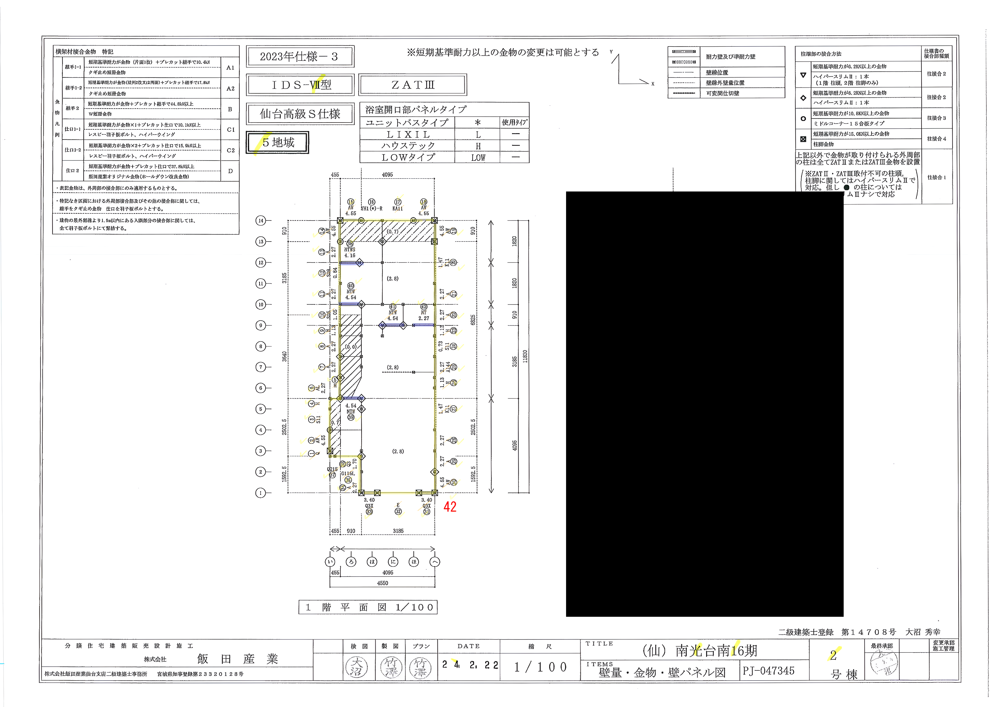

In [11]:
def draw_bbox_on_img(coordinate_point, image_pil):
    draw = ImageDraw.Draw(image_pil)
    draw.rectangle(((coordinate_point[0], coordinate_point[1]), (coordinate_point[2], coordinate_point[3])), fill="black")
    return image_pil

draw_bbox_on_img([3744, 1267, 5579, 4080], img_high)

In [ ]:
for component in result_draw_df['boxes']:
    cad_ele = img_high.crop(component)
    cad_ele.save('')

In [16]:
from src.utils import combine_rephrase_dict_2
draw_information_dict = {}
count = 0
for idx, draw_location in enumerate(draw_location_list):
    # floor_str = str(idx)
    
    code_df = raw_code_df[raw_code_df.boxes.apply(lambda b: calc_ovl(b, draw_location) > 0.5)]
    code_df.reset_index(drop=True, inplace=True)
    num_cell, cell_width, cell_height = get_cell_size(code_df)
    num_cell = int(num_cell)
    concat_image_pil = gen_grid_image(img_high, code_df, num_cell, cell_width, cell_height)
    draw_words, draw_boxes = ocr_azure_cad(concat_image_pil.copy(), COMPUTERVISION_CLIENT)
    extract_dict = mapping_code(img_high, draw_words, draw_boxes, code_df,
                                num_cell, cell_width, cell_height, is_display= False)
    
    extract_dict = combine_rephrase_dict_2(extract_dict)
    draw_information_dict[count] = extract_dict
    count += 1

    # extract_dict = refine_format(extract_dict, floor_str)

Refining output: 100%|██████████| 42/42 [00:00<00:00, 287844.39it/s]


In [13]:
import pickle

list_infor_cad = {}

with open('/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/weight/dict.pkl', 'rb') as f:
            dict_class = pickle.load(f)


for idx_cad in range(len(draw_information_dict)):
    list_infor_cad[idx_cad] = []
    for idx_core, core in draw_information_dict[idx_cad].items():
        if core == '':
               core = 'A'
        
        if core in dict_class:
            result = core #reformat_code(core)
        else:
            list_score_similarity = []
            print('The system not found this code this dict so we will calculate similarity of it with all code in dict')
            for idx_core_cad in dict_class:
                score_similarity = calculator_similarity_str(str_1= core, str_2= idx_core_cad)
                list_score_similarity.append(score_similarity)
            idx_code_max = list_score_similarity.index(max(list_score_similarity))
            result = dict_class[idx_code_max]
            # reformat_code(result= result)
        list_infor_cad[idx_cad].append(result)

The system not found this code this dict so we will calculate similarity of it with all code in dict
The system not found this code this dict so we will calculate similarity of it with all code in dict
The system not found this code this dict so we will calculate similarity of it with all code in dict
The system not found this code this dict so we will calculate similarity of it with all code in dict
The system not found this code this dict so we will calculate similarity of it with all code in dict
The system not found this code this dict so we will calculate similarity of it with all code in dict
The system not found this code this dict so we will calculate similarity of it with all code in dict
The system not found this code this dict so we will calculate similarity of it with all code in dict
The system not found this code this dict so we will calculate similarity of it with all code in dict
The system not found this code this dict so we will calculate similarity of it with all cod

In [14]:
list_infor_cad

{0: [['AW',
   'A',
   'A670',
   'A670L',
   'A670R',
   'AL',
   'AL+12',
   'AO',
   'AOL',
   'AOR',
   'AOS',
   'AR',
   'AR+12',
   'AX',
   'AX144',
   'AZ',
   'CH',
   'A144',
   'A144L',
   'A144R',
   'H',
   'HO',
   'HOS',
   'HL',
   'HOL',
   'HR',
   'HOR',
   'HL+12',
   'HR+12',
   'HX',
   'HZ',
   'NT',
   'NTW',
   'NTH',
   'NTWH',
   'NTQ3',
   'NTWQ3',
   'NTQ600',
   'NTWQ600',
   'NTS',
   'NTWS',
   'Q3O',
   'Q3OL',
   'Q3OR',
   'Q3OS',
   'Q3R+12',
   'Q3Z',
   'Q215',
   'Q215L',
   'Q215R',
   'Q305',
   'Q305L',
   'Q305R',
   'Q310',
   'Q310L',
   'Q310R',
   'Q600',
   'Q600L',
   'Q600R',
   'Q',
   'QO',
   'QL',
   'QOL',
   'QR',
   'QOR',
   'Q3',
   'Q3L',
   'Q3R',
   'Q3X',
   'Q3L+12',
   'QO300S',
   '22MAW',
   '22MA',
   '22MA670',
   '22MA670L',
   '22MA670R',
   '22MAL',
   '22MAL+12',
   '22MAO',
   '22MAOL',
   '22MAOR',
   '22MAOS',
   '22MAR',
   '22MAR+12',
   '22MAX',
   '22MAX144',
   '22MAZ',
   '22MCH',
   '22MA144',
   '22MA1

In [28]:
list_ids = extract_dict['digit_code']
list_code = extract_dict['code']

# Pair up the elements of the two lists
paired_list = list(zip(list_ids,list_code))

# # Sort the pairs based on the first element
paired_list.sort(key=lambda x: x[0])

list_ids, list_code = zip(*paired_list)
# Separate the sorted pairs back into two lists
list_ids, list_code = zip(*paired_list)
dict_refine= {}
# Convert the lists back to lists (since zip returns tuples)
list_ids = list(list_ids)
list_code = list(list_code)
for i in tqdm(range(len(list_code)), desc= "Refining ouput"):
    dict_refine[int(list_ids[i])] = list_code[i]

Refining ouput: 100%|██████████| 33/33 [00:00<00:00, 688617.07it/s]


In [30]:
def combine_rephrase_dict(dict_result: Dict = {}) -> Dict:
    list_ids = dict_result['digit_code']
    list_code = dict_result['code']

    # Pair up the elements of the two lists
    paired_list = list(zip(list_ids, list_code))

    # Sort the pairs based on the first element
    paired_list.sort(key=lambda x: x[0])

    list_ids, list_code = zip(*paired_list)

    # Separate the sorted pairs back into two lists
    list_ids, list_code = zip(*paired_list)

    dict_refine = {}
    min_id = min(list_ids)
    max_id = max(list_ids)

    for i in tqdm(range(min_id, max_id + 1), desc="Refining output"):
        if i in list_ids:
            dict_refine[i] = list_code[list_ids.index(i)]
        else:
            dict_refine[i] = ""

    return dict_refine

print(dict_refine)

Refining output: 100%|██████████| 37/37 [00:00<00:00, 1007722.39it/s]

{1: 'H', 2: 'A', 3: 'KH11', 4: '', 5: '', 6: 'A', 7: 'A', 8: '90MA', 9: '90MH', 10: '90MA', 11: '90MH', 12: '90MK09', 13: '90MA', 14: 'DOMH', 15: '90MA', 16: '90MA', 17: 'A', 18: 'SOL-L', 19: 'A', 20: '', 21: '5Z11-R', 22: 'A', 23: 'H', 24: 'A', 25: 'AX', 26: 'AL', 27: 'KH11-L', 28: 'H', 29: 'AX', 30: '', 31: 'H', 32: '', 33: 'M(150中心用)', 34: 'A', 35: 'NT', 36: 'POMNTW', 37: 'NT'}
